# Image Stitching



Image stitching is a process that combines multiple overlapping photographs seamlessly to produce a panoramic or high-resolution image. The technique is commonly employed in various applications, such as virtual tours, panoramic photography, and satellite imaging.

Image stitching can be broadly divided into the following steps:

1. Feature Extraction: Detect distinctive features or keypoints in each image using algorithms like SIFT, SURF, or ORB.
2. Feature Matching: Identify common features between pairs of images, ensuring a robust match using methods like the Brute-Force Matcher or the FLANN-based matcher.
3. Homography Estimation: Calculate the transformation matrix (homography) that relates the matched features of the images. Robust estimation techniques, such as RANSAC, LMedS, or RHO, can be employed to mitigate the impact of erroneous matches or outliers.
4. Image Warping and Combination: Use the derived homography to transform (or warp) the images into a common coordinate system and combine them, creating the stitched panorama.
5. Post-processing: Refine the resultant image by cropping any undesired regions or by smoothing the transitions in overlapping areas.

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from pathlib import Path

### Load Images

In [ ]:
def display_images(img_path1, img_path2, output_file, image_number='4'):
    # Read the images using OpenCV
    img1 = cv2.imread(img_path1)
    img2 = cv2.imread(img_path2)

    # Convert BGR format (used by OpenCV) to RGB format (used by Matplotlib)
    img1_rgb = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
    img2_rgb = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

    # Create a new figure
    plt.figure(figsize=(10, 5))

    # Plot first image
    plt.subplot(1, 2, 1)
    plt.imshow(img1_rgb)
    first_img = f"Image {image_number}a"
    plt.title(first_img)
    plt.axis('off')  # Do not show axis values

    # Plot second image
    plt.subplot(1, 2, 2)
    plt.imshow(img2_rgb)
    second_img = f"Image {image_number}b"
    plt.title(second_img)
    plt.axis('off')  # Do not show axis values

    # Display the images
    plt.tight_layout()
    plt.savefig(output_file, bbox_inches='tight', pad_inches=0.1)
    plt.show()


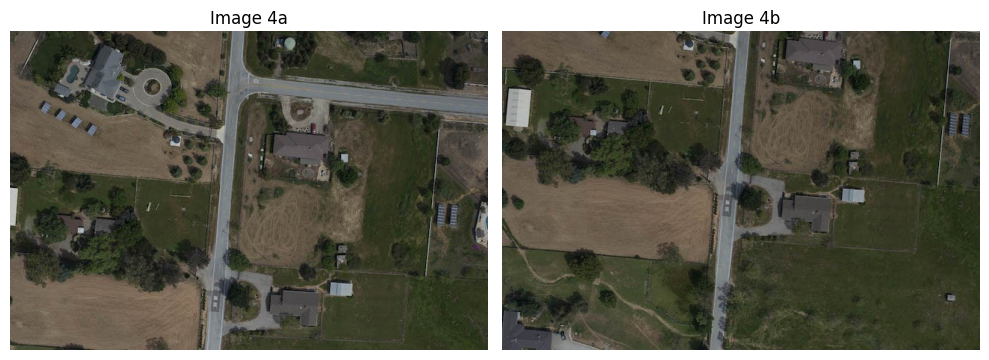

In [ ]:
# display_images('/content/image pairs_01_01.jpg', '/content/image pairs_01_02.jpg', '1')
# display_images('/content/image pairs_02_01.png', '/content/image pairs_02_02.png', 'image_pair_02.png', '2')
# display_images('/content/image pairs_03_01.jpg', '/content/image pairs_03_02.jpg', 'image_pair_03.png', '3')
display_images('/content/image pairs_04_01.jpg', '/content/image pairs_04_02.jpg', 'image_pair_04.png', '4')



### Read all files in the folder

In [ ]:
import os

def get_jpeg_files_in_folder(folder_path):
    jpeg_files = {}
    # jpeg_files = []

    if not os.path.exists(folder_path):
        print(f"The folder '{folder_path}' does not exist.")
        return jpeg_files

    for filename in os.listdir(folder_path):
        if filename.lower().endswith(('.jpeg', '.jpg', '.png')):
            # jpeg_files.append(filename)
            file_path = f"{folder_path}/{filename}"

            image = cv2.imread(file_path)
            rgb_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

            # print ('filepath', file_path)
            # new_file_name = Path(file_path).stem # only file name without extension
            # new_file_name = Path(file_path).name # include extension .jpg
            new_file_name = file_path # TODO: change
            jpeg_files[new_file_name] = rgb_image

    # return jpeg_files
    return dict(sorted(jpeg_files.items()))

In [ ]:
# Example usage:
folder_path = 'imgs'
jpeg_files = get_jpeg_files_in_folder(folder_path)

image_names = list(jpeg_files.keys())
print (image_names)

#values saved are in RGB format

### Feature Detection & Mapping

Harris corner detection and SIFT

In [ ]:
def harris(img_dir):
    img = cv2.imread(img_dir)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)  # Turn image to gray
    gray = np.float32(gray)
    harris = cv2.cornerHarris(gray,2,3,0.04)  # blockSize=2, ksize=3, k=0.04

    # Get coordinates of detected corners
    corner_coords = np.argwhere(harris>0.01*harris.max())

    # Result is dilated for marking the corners, not important
    harris = cv2.dilate(harris,None)

    # Threshold for an optimal value, it may vary depending on the image.
    img[harris>0.01*harris.max()]=[0,0,255]


    img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    return img_color, corner_coords # 2 outputs

In [ ]:
# plot and save individual images

def harris_all_imgs(jpeg_files, save=False):
  image_names = list(jpeg_files.keys())
  print (image_names)

  fig, axes = plt.subplots(4, 2, figsize=(6, 10))
  axes = axes.ravel()

  for i, img in enumerate(image_names):
      outputs = harris(img)
      img_display = outputs[0]
      img_title = Path(img).stem
      axes[i].set_title(img_title)
      axes[i].imshow(img_display)

      # print(f"Coordinates for detected corners in Sample {img_title}")
      print(outputs[1])

  # Remove x and y ticks for a cleaner look
  for ax in axes.ravel():
      ax.axis('off')

  if save==True:
    file_name = "harris.png"
    # cv.imwrite('harris.png', cv2.cvtColor(he_rbg, cv.COLOR_RGB2BGR)
    plt.savefig(file_name, bbox_inches='tight', dpi=500)

  # Add spacing between subplots
  plt.tight_layout()
  # Display the figure
  plt.show()

# harris_all_imgs(jpeg_files, save=True)

## Image Stitching (default)

### Main SIFT, Homography Functions

In [ ]:
def sift(imgdir,corner_loc):
    sift = cv2.xfeatures2d.SIFT_create()
    keypoints=[]
    img=cv2.imread(imgdir,0)
    if corner_loc is None:
      # corner_loc, if no custom keypoints were provided, will automatically detect and compute
      keypoints, descriptors = sift.detectAndCompute(img, None) # automatic detection
    else:
      for n in range(len(corner_loc)):
          kp = cv2.KeyPoint(float(corner_loc[n][1]),float(corner_loc[n][0]),10)
          keypoints.append(kp)

      keypoints, descriptors = sift.compute(img,keypoints)

    return keypoints, descriptors


def homography(descriptor1,keypoints1,descriptor2,keypoints2):
    matcher = cv2.BFMatcher()
    raw_matches = matcher.knnMatch(descriptor1, descriptor2, k=2)
    good_points = []
    good_matches=[]
    for m1, m2 in raw_matches:
        if m1.distance < 0.85 * m2.distance:
            good_points.append((m1.trainIdx, m1.queryIdx))
            good_matches.append([m1])

    if len(good_points) > 8:
        image1_kp = np.float32(
            [keypoints1[i].pt for (_, i) in good_points])
        image2_kp = np.float32(
            [keypoints2[i].pt for (i, _) in good_points])

    #     print (f"Len of kp for img1 {image1_kp.shape} img 2: {image2_kp.shape}")

    # print (f"len of good points {len(good_points)} and good matches {len(good_matches)}")

    (H, status) = cv2.findHomography(image2_kp, image1_kp, cv2.RANSAC, 5)

    return H, good_matches


def mask(img1,img2,version):
    smoothing_window_size=188
    height_img1 = img1.shape[0]
    width_img1 = img1.shape[1]
    width_img2 = img2.shape[1]
    height_panorama = height_img1
    width_panorama = width_img1 +width_img2
    offset = int(smoothing_window_size / 2)
    barrier = img1.shape[1] - int(smoothing_window_size / 2)
    mask = np.zeros((height_panorama, width_panorama))
    if version== 'left_image':
        mask[:, barrier - offset:barrier + offset ] = np.tile(np.linspace(1, 0, 2 * offset ).T, (height_panorama, 1))
        mask[:, :barrier - offset] = 1
    else:
        mask[:, barrier - offset :barrier + offset ] = np.tile(np.linspace(0, 1, 2 * offset ).T, (height_panorama, 1))
        mask[:, barrier + offset:] = 1
    return cv2.merge([mask, mask, mask])


def blending(img1,img2,H):
    height_img1 = img1.shape[0]
    width_img1 = img1.shape[1]
    width_img2 = img2.shape[1]
    height_panorama = height_img1
    width_panorama = width_img1 +width_img2

    panorama1 = np.zeros((height_panorama, width_panorama, 3))
    mask1 = mask(img1,img2,version='left_image')
    panorama1[0:img1.shape[0], 0:img1.shape[1], :] = img1
    panorama1 *= mask1
    mask2 = mask(img1,img2,version='right_image')
    panorama2 = cv2.warpPerspective(img2, H, (width_panorama, height_panorama))*mask2
    result=panorama1+panorama2

    # Get rid of black borders created by perspective differences and unused space
    rows, cols = np.where(result[:, :, 0] != 0) # Check if a pixel is pure black or not (0-255) and get the ones that are not black as rows and cols
    min_row, max_row = min(rows), max(rows) + 1
    min_col, max_col = min(cols), max(cols) + 1
    final_result = result[min_row:max_row, min_col:max_col, :] # Resize image without black borders

    return final_result

### Plot Figures

In [ ]:
def plot_matches(img1,keypoints1,img2,keypoints2, good_matches, img_name, save=True):
  plt.figure(figsize=(10, 10))

  temp_file_name = Path(img_name).stem
  file_name = f"{temp_file_name[:-3]}"

  draw_params = dict(matchColor = (0,0,255), singlePointColor = None,
                  flags = 2)
  img3 = cv2.drawMatchesKnn(img1,keypoints1,img2,keypoints2, good_matches, None,**draw_params)
  img3 = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)

  plt.imshow(img3)
  if save:
      plt.savefig(f'{file_name}-matches.png', bbox_inches='tight', dpi=300)
  # plt.show()

In [ ]:
def save_final_img(img_name, image_result):

  plt.figure(figsize=(10, 10))

  temp_file_name = Path(img_name).stem
  file_name = f"{temp_file_name[:-3]}-result.png"

  print (f'Saving Final Result... {file_name}')

  plt.imshow(image_result)
  plt.savefig(file_name, bbox_inches='tight', dpi=300)


### Main Run Function

Use sift with custom keypoints (e.g. Harris Window) detected or automatic keypoints (within the library).

In [ ]:
def image_stitch(imgdir1,imgdir2, save=True):
    #Intialize variables
    keypoints={}
    descriptors={}

    corner_loc1=harris(imgdir1)
    corner_loc2=harris(imgdir2)

    keypoints1, descriptors1=sift(imgdir1,corner_loc1[1])
    keypoints2, descriptors2=sift(imgdir2,corner_loc2[1])
    ## Use these 2 lines if want to use SIFT keypoints default
    # keypoints1, descriptors1=sift(imgdir1,None)
    # keypoints2, descriptors2=sift(imgdir2,None)

    #Get homography matrix
    H, good_matches = homography(descriptors1,keypoints1,descriptors2,keypoints2)

    #Load images
    img1 = cv2.imread(imgdir1)
    img2 = cv2.imread(imgdir2)

    plot_matches(img1,keypoints1,img2,keypoints2, good_matches, imgdir1, save) # show matches

    #Create composite image
    result = blending(img1,img2,H)
    result = result.astype(np.uint8)
    result = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)

    # save final result
    if save:
      save_final_img(imgdir1, result)
    return result

Saving Final Result... image pairs_01-result.png
Saving Final Result... image pairs_02-result.png
Saving Final Result... image pairs_03-result.png
Saving Final Result... image pairs_04-result.png


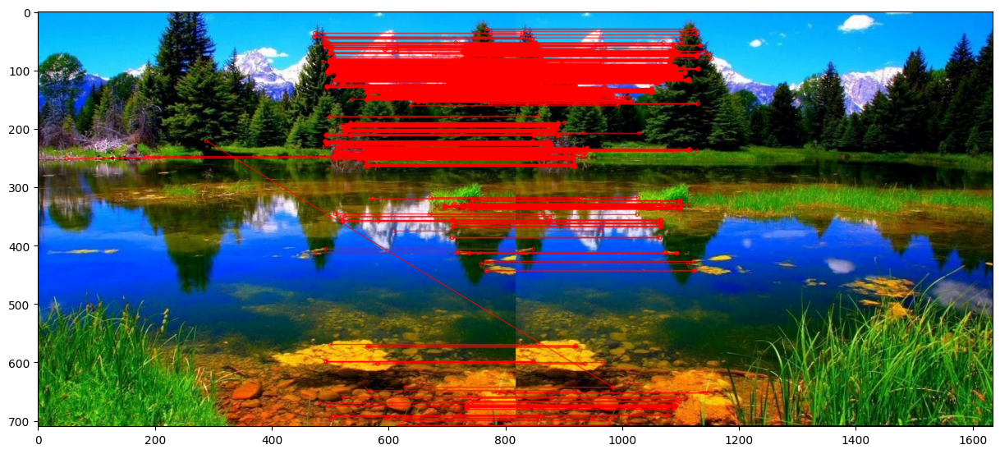

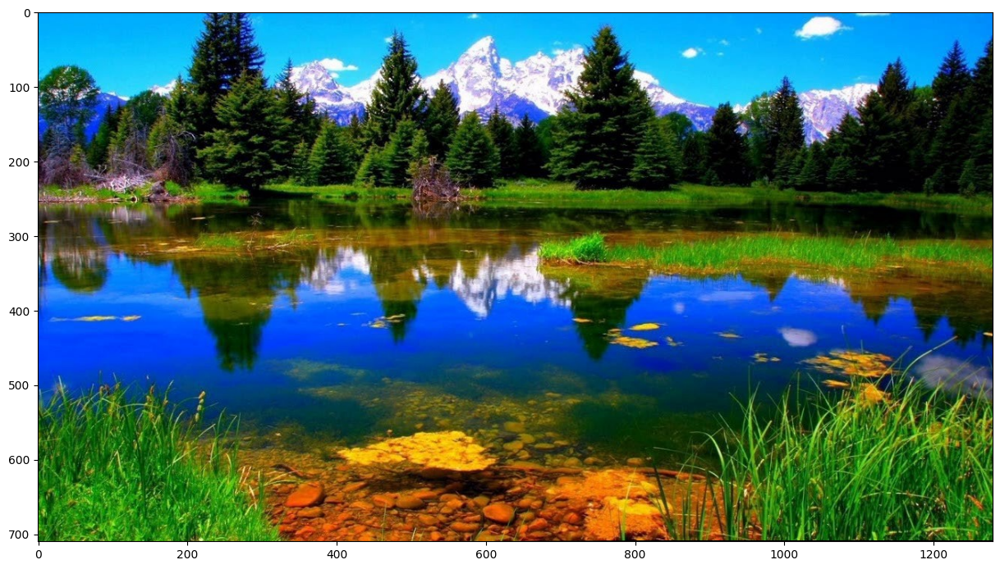

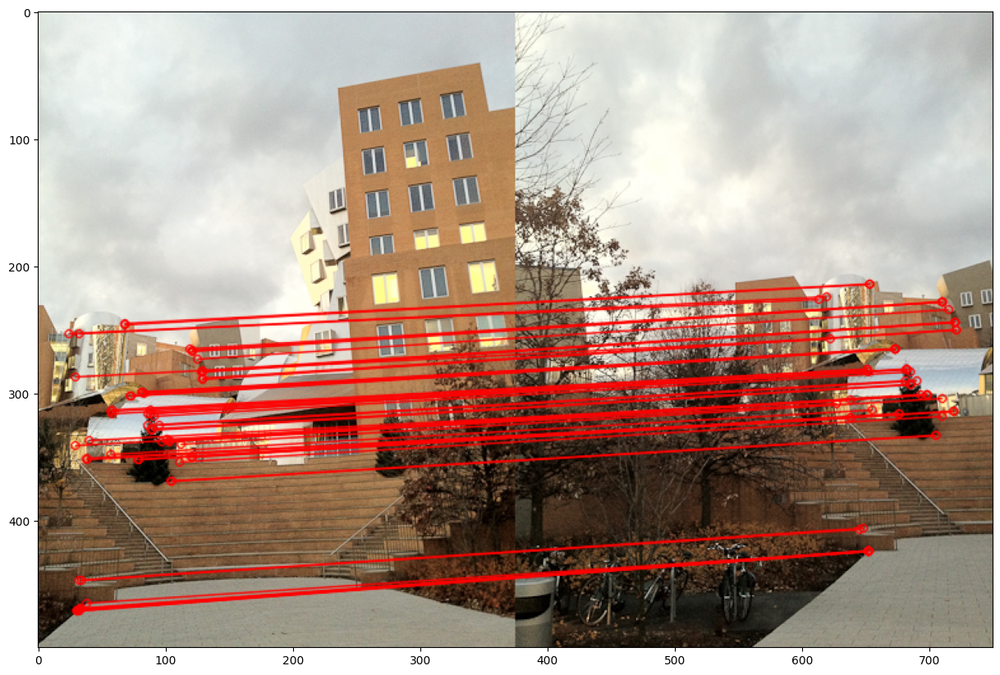

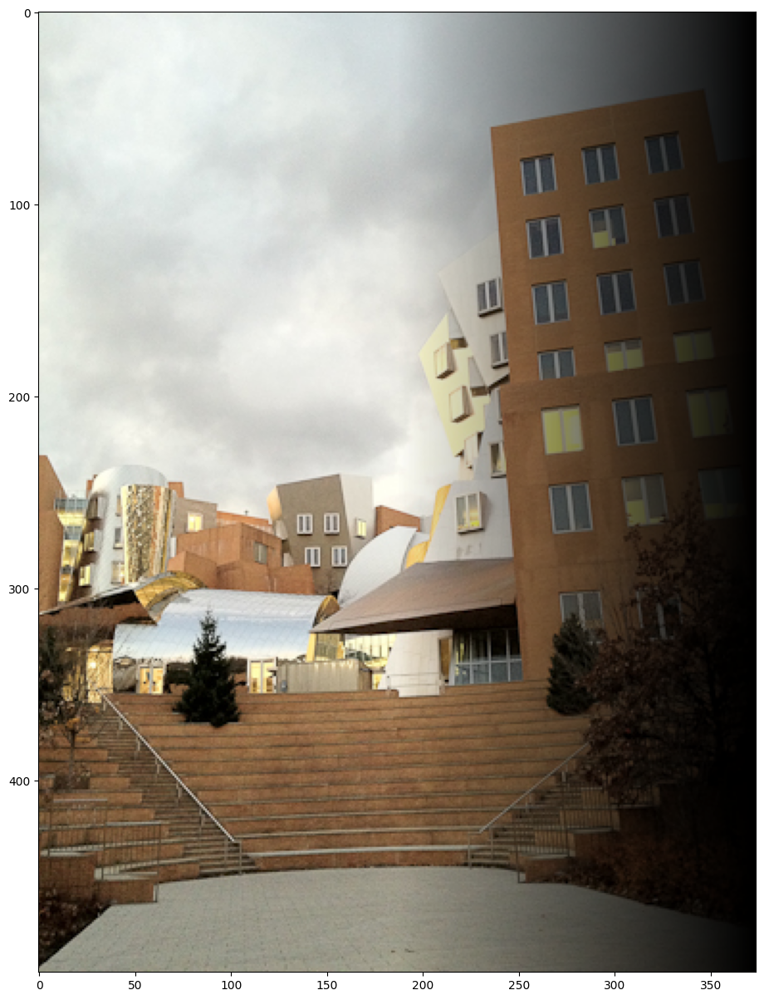

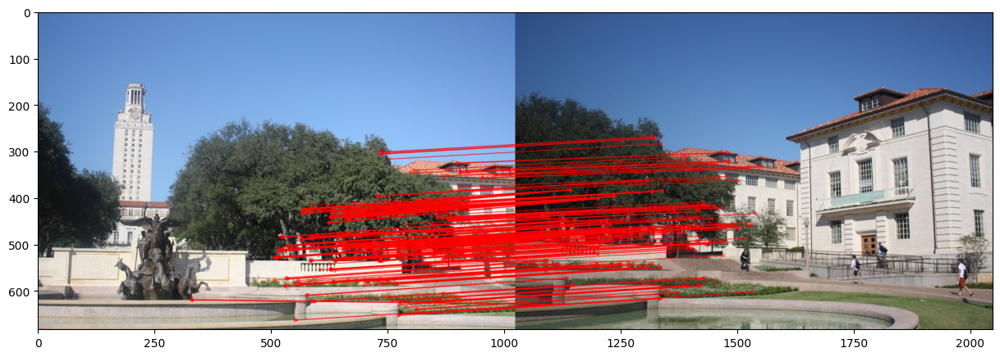

...

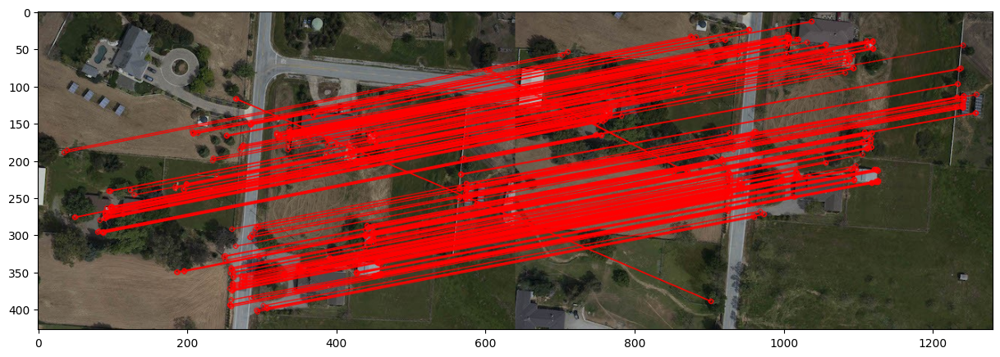

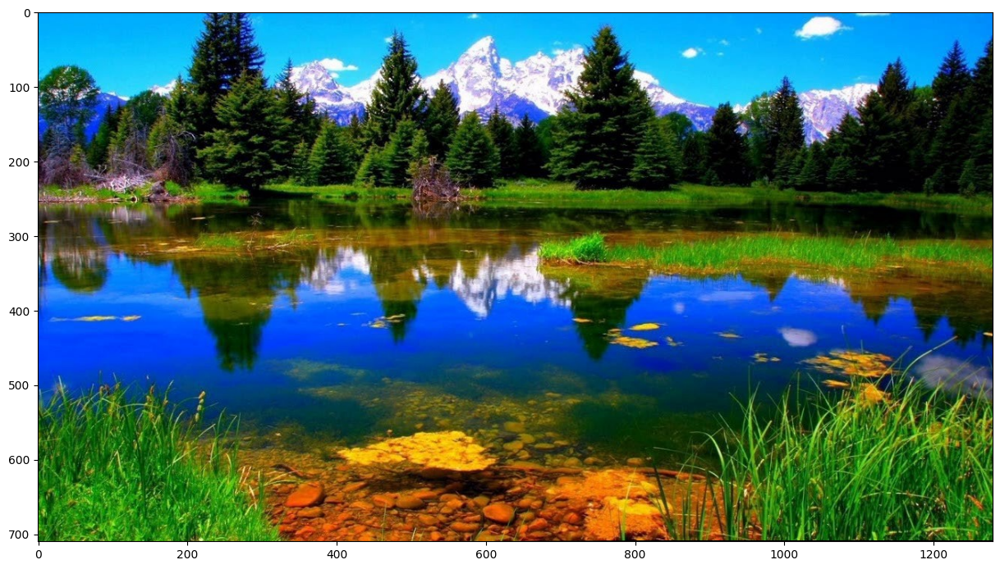

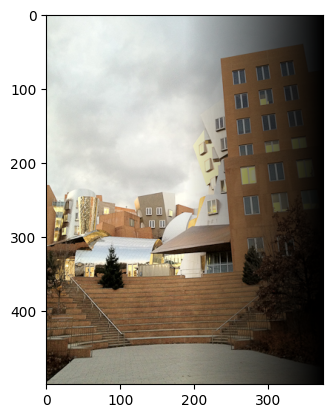

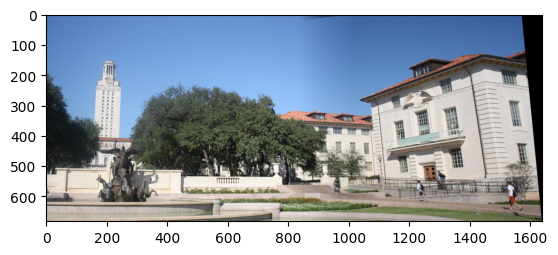

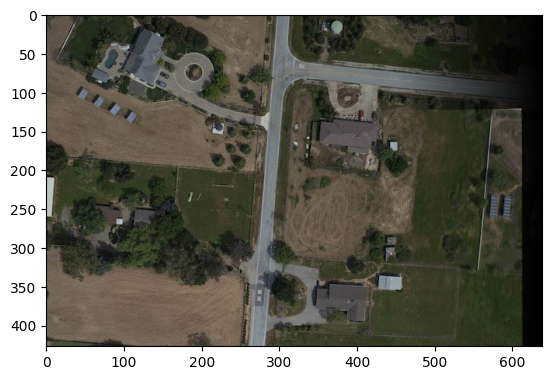

In [ ]:
result1 = image_stitch("/content/image pairs_01_01.jpg", "/content/image pairs_01_02.jpg")
result2 = image_stitch("/content/image pairs_02_01.png", "/content/image pairs_02_02.png")
result3 = image_stitch("/content/image pairs_03_01.jpg", "/content/image pairs_03_02.jpg")
result4 = image_stitch("/content/image pairs_04_01.jpg", "/content/image pairs_04_02.jpg")

plt.imshow(result1)
plt.show()
plt.imshow(result2)
plt.show()

plt.imshow(result3)
plt.show()
plt.imshow(result4)
plt.show()